# Predicting Wine Reviewer Name using Wine Reviews...? Yes!!

## Introduction to my Thought Process
    The question in its essence is, are Wine Reviews written over time sufficient enough to 'unconsciously' know who was it that wrote the Review?

As a start, I wanted to restrict my temptation to consider other factors such as Country, Region, points, etc; as they would give us more insight on how each Reviewer belonging to a specific region affects their availability to a Wine in order to write a Review or how he/she evaluates a Wine.
<br></br>
##### This word, '<i>evaluates</i>' now begs the question, are Wine Reviews enriched enough to help us know which Reviewer they have been written by? 
    I bilieve so, since it's the journey (Explaination) that tells a lot more than the destination (Quantified Evaluation).
A little bit of background about myself, I am definietly not a Wine-taster, all I have wondered about Alcohol is, does it taste good and gets me the buzz? What I am trying to say is, I do not really Know what is it that a Wine-Reviwer looks for in a Wine. <br></br>
<ul><li>As a being, outside the domain of a Subject Matter Expert in Wine, I would begin by looking out for the words Reviewers use to describe a Wine.<ul><li>Which I did so, using the Word Clouds</li></ul>
    <li>As I went through the WordClouds, which generate high frequency words appeared in the document (Reviews), I observed that certain users do like to use lot of Stop_Words, 'with' being an Interesting one.<ul><li>This showed me a glimpse of what a Reviewer looks for,<ul><li>Culmination of tastes and smells of Wine</li></ul></li></ul>
    <li>Next, I removed the Stop_Words to understand the nature with which a Reviewer approaches the tasting of Wine.<ul><li>For example, some looked for the Aromas more than the Palate taste and vice-versa</li></ul></li></ul>

These <b>observations</b> as I will talk about as we go through the code, led me to believe that Reviews contained sufficient information to determine who the Reviewer was.
<br></br>
### What next?
<ul><li>Now that the exploration of Reviews led me to believe (for lack of a better word) that we do can use the Reviews to figure of who the Reviewer was, I chose to stick to Machine Learning algorithms.<ul>
    <li> Only stuck to ML algorithms as the data-set was just in 100,000s and ML- algorithms are sufficiently powerful enough to predict the outcome for not so large dataset, as we will see.</li></ul></li>
    <li> My first Intuition was to use Logistic Regression, with One-vs-Rest Classification since, after we do the Tf-IDF of the reviewes, the words can be considered as dimensions and the Reviewer as the data point in that Manifold created by them dimensions.</li>
    <li>Then after testing with other ML-algorithms such as Random Forests and K-NN, It hit me that SVMs would do a great job of getting to the global-optimum because of their nature of Dual-Optimization of a Paraboloid, which it turns out absolutely does.</li>
    <li>Apart from all the other analysis and prediction, one of the important factors was the imbalance of Classes(Reviewers), hence, used SMOTE analysis.</li>
    

## Loading up the Dataset

In [1]:
import numpy as np
import pandas as pd
import nltk
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Rohit\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Rohit\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [2]:
PATH = "C:\\Users\\Rohit\\Deep Learning\\" 

df_raw= pd.read_csv(f'{PATH}winemag-data-130k-v2.csv', low_memory=False)

In [3]:
# generating word frequencies
def gen_freq(text):
    # list of words
    word_list = [] 
    
    # loop over all the text docs and extract words into word_list

    for sentence in text:
        for words in sentence.split():
            word_list.append(words)
    
    # create word freuencies using word_list
    word_freq = pd.Series(word_list).value_counts()
    
    return word_freq

In [4]:
stop_words = set(stopwords.words('english'))
'With' in stop_words

False

### Word Cloud of Each Reviewer - with Stop_Words

['Kerin O’Keefe']


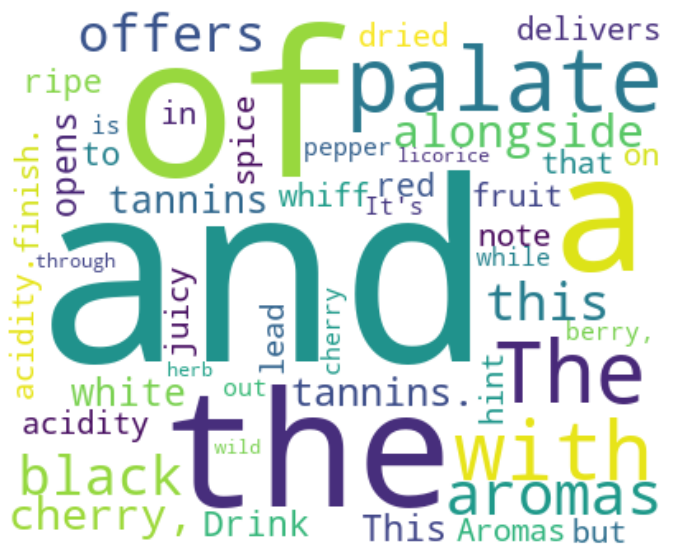

['Roger Voss']


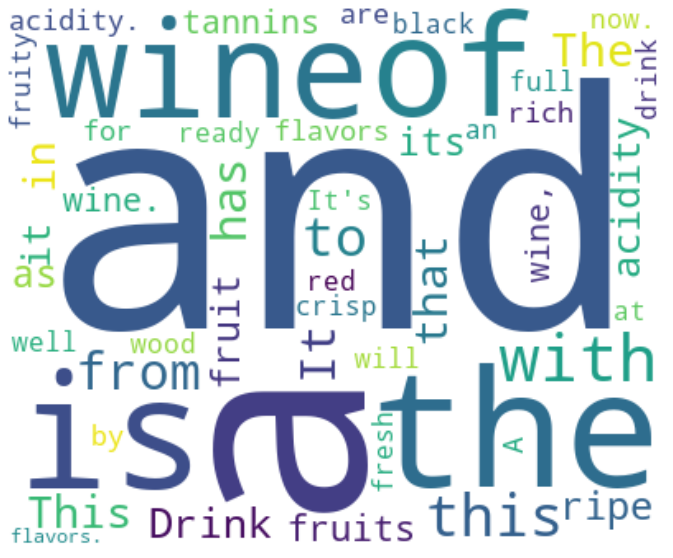

['Paul Gregutt']


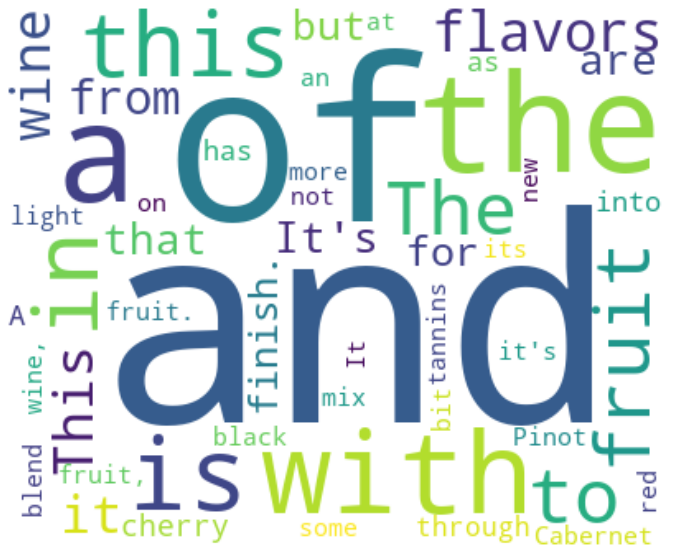

['Alexander Peartree']


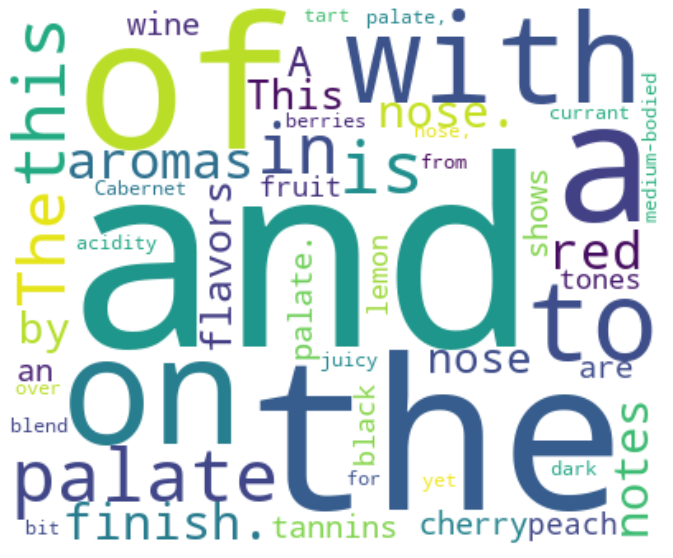

['Michael Schachner']


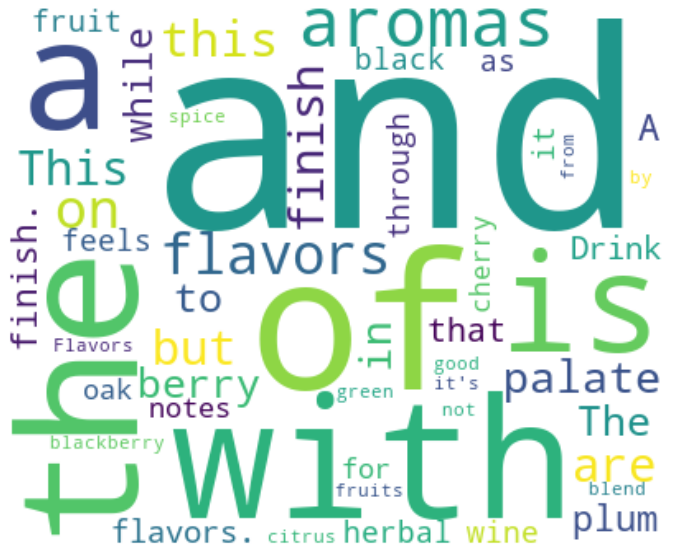

['Anna Lee C. Iijima']


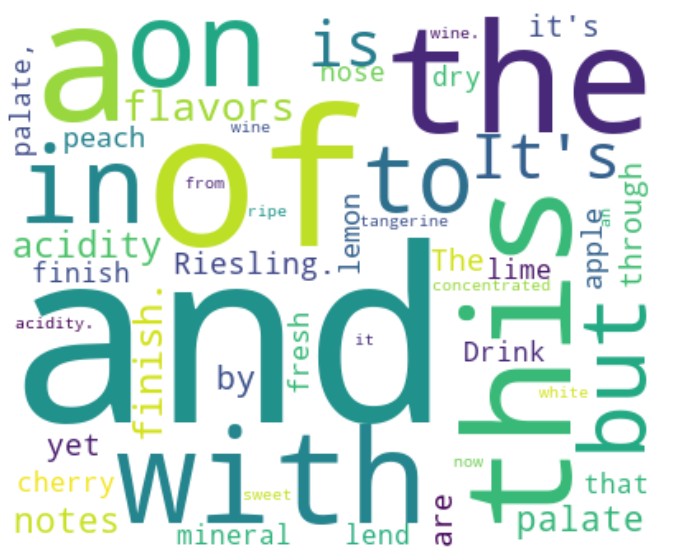

['Virginie Boone']


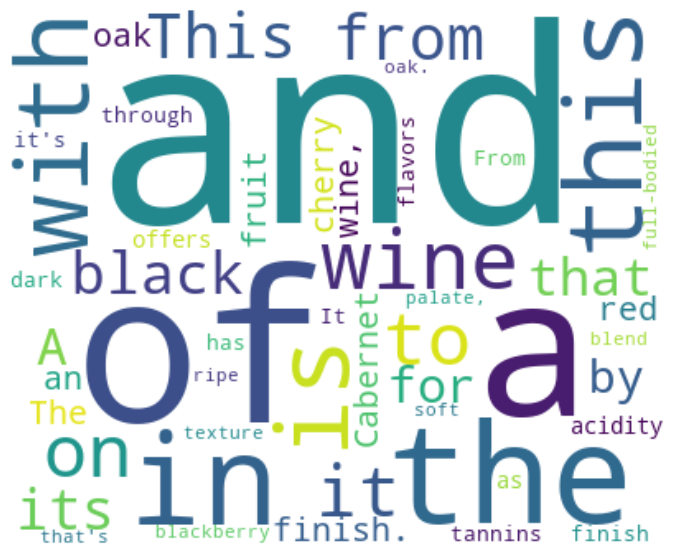

['Matt Kettmann']


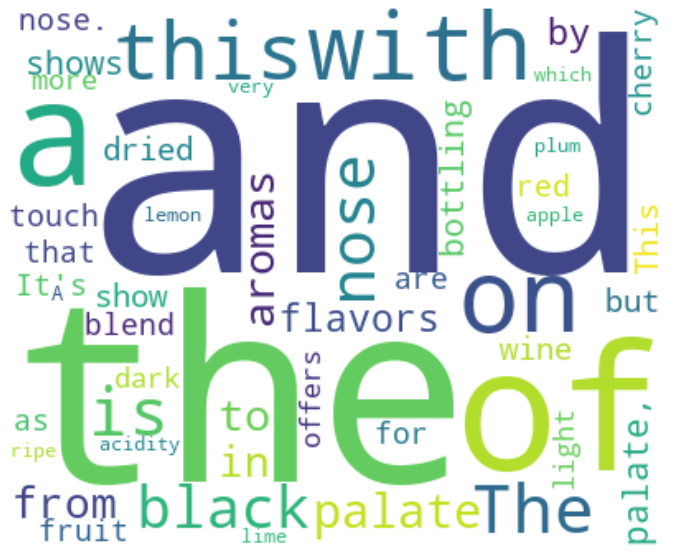

['Sean P. Sullivan']


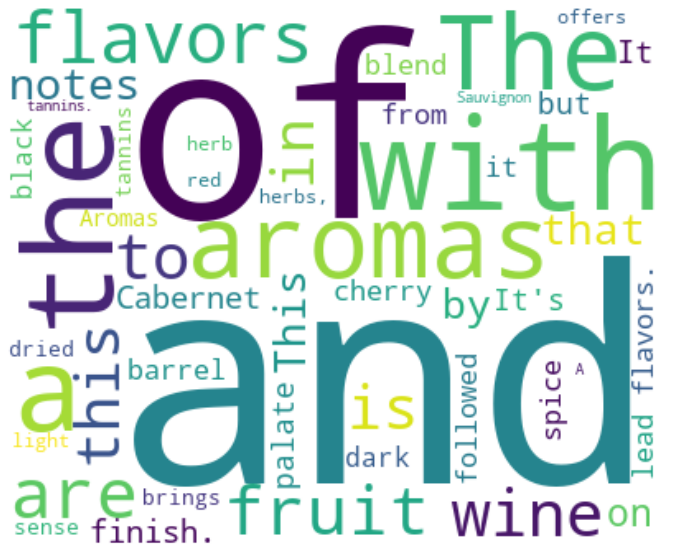

['Jim Gordon']


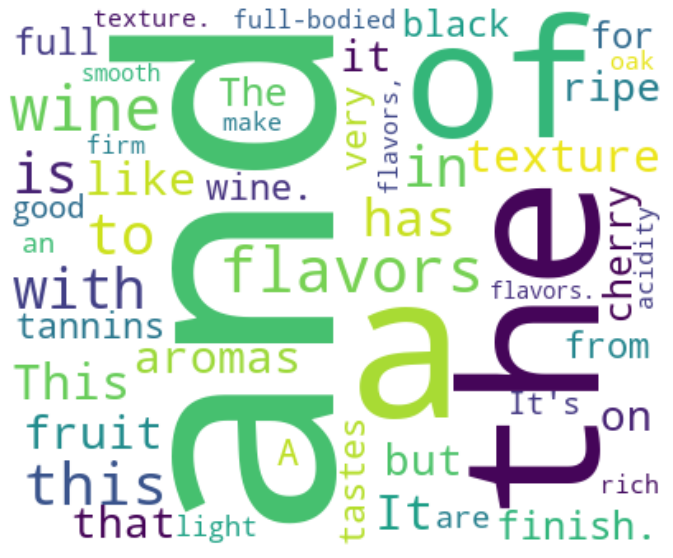

['Joe Czerwinski']


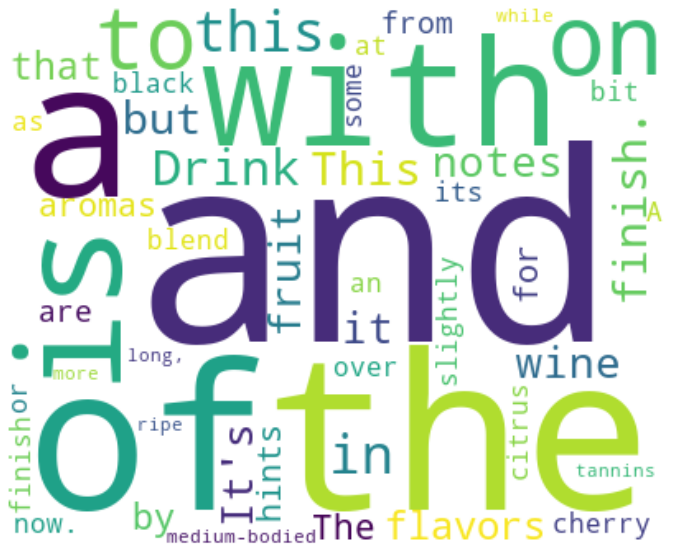

['Anne Krebiehl\xa0MW']


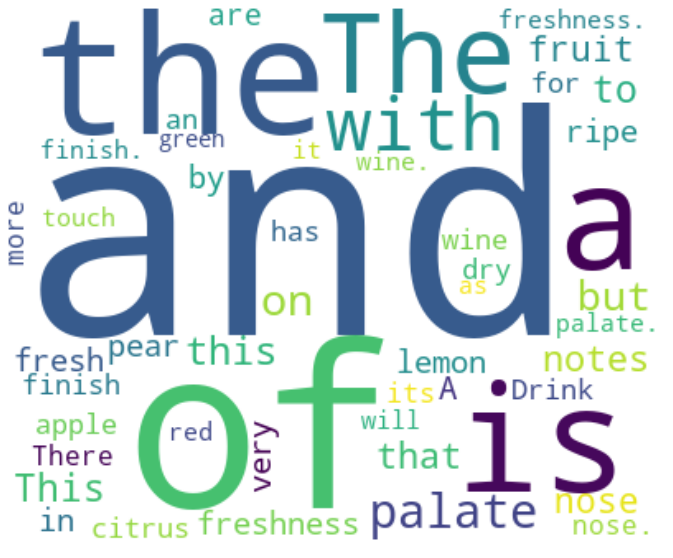

['Lauren Buzzeo']


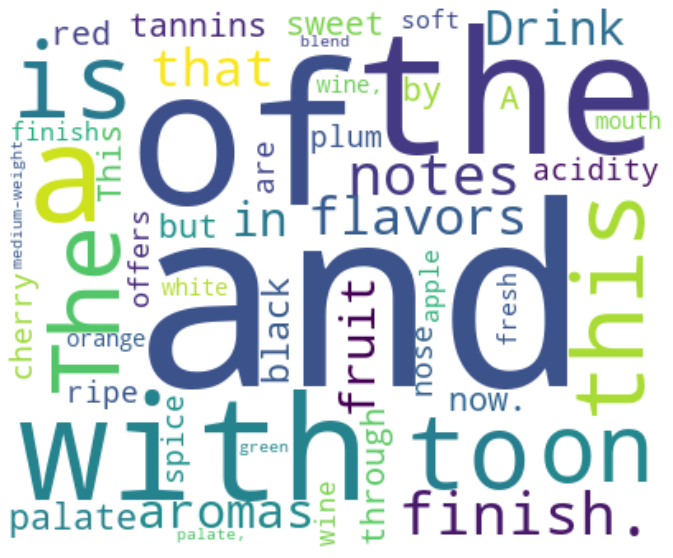

['Mike DeSimone']


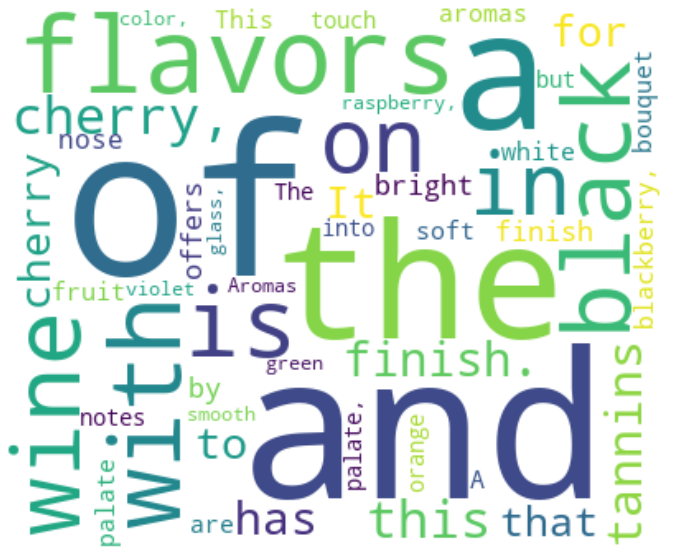

['Jeff Jenssen']


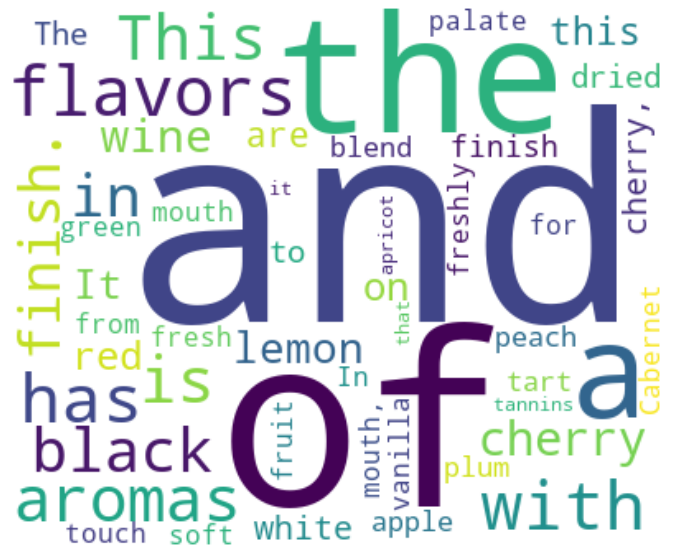

['Susan Kostrzewa']


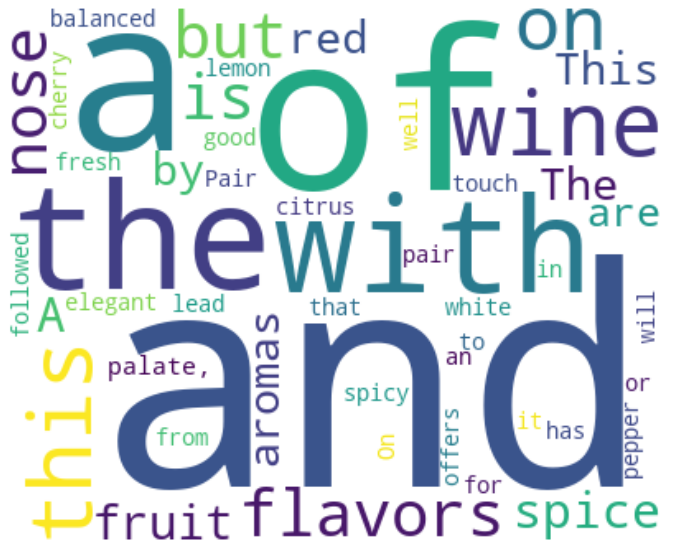

['Carrie Dykes']


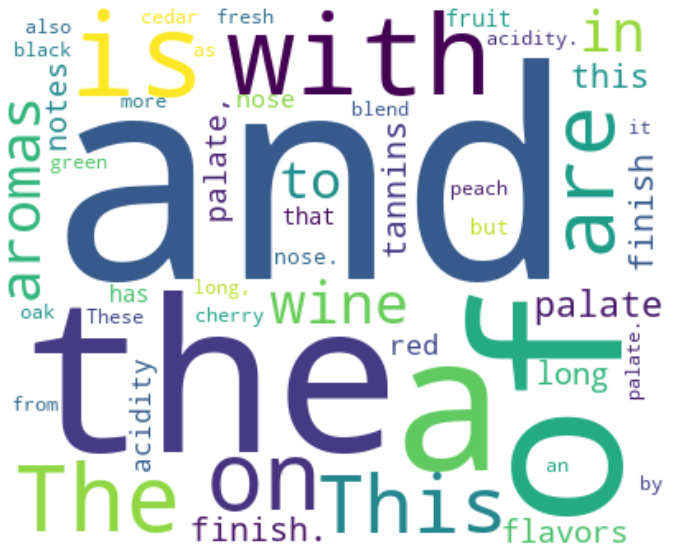

['Fiona Adams']


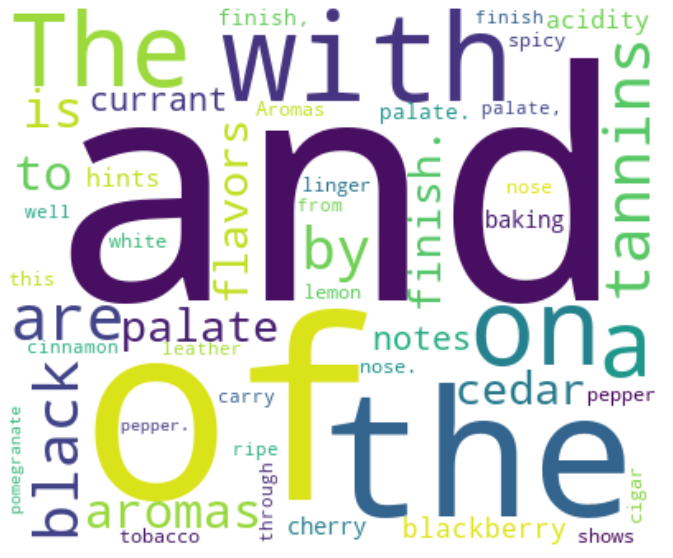

['Christina Pickard']


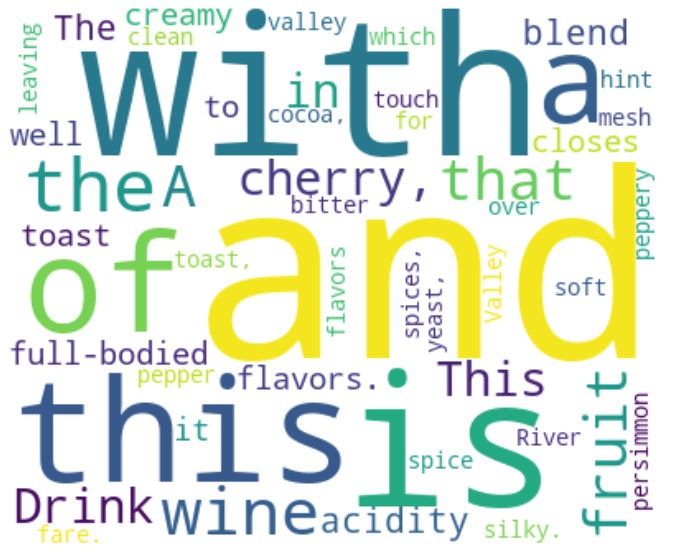

In [18]:
for i in df_raw['taster_name'].dropna().unique():
    newb=df_raw[['description','taster_name']][df_raw['taster_name']==i]
    word_freq_view = gen_freq(newb['description'].tolist())
    wc_normal = WordCloud(width = 400, height = 330, max_words = 50, background_color = 'white', stopwords = stop_words).generate_from_frequencies(word_freq_view)
    print(newb['taster_name'].unique())
    plt.figure(figsize = (14, 10))
    plt.imshow(wc_normal, interpolation = 'bilinear')
    plt.axis('off')
    plt.show()

### Oberservation:

What I saw in those Word Clouds (with Stop_words) is that some Reviewers look for multiple flavours as well as aromas and clumination of them two.<ul><li>Which led to words such as 'and','with', as well as, 'this' to have high frequency.</li></ul>

### Word Cloud of Each Reviewer without Stop_Words

['Kerin O’Keefe']


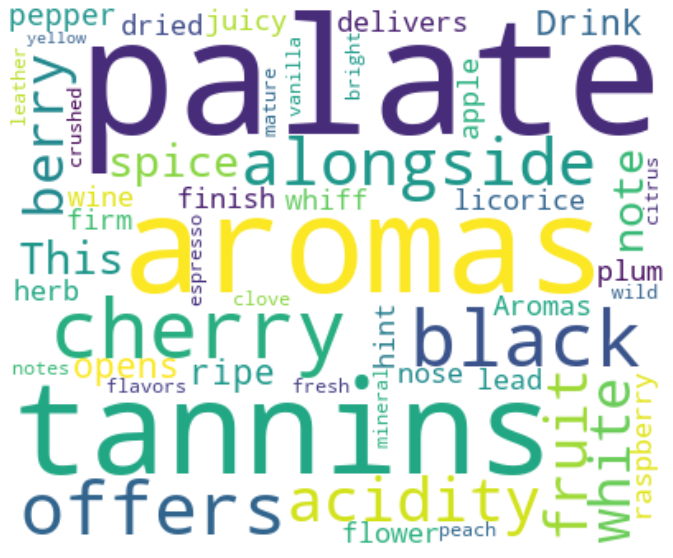

['Roger Voss']


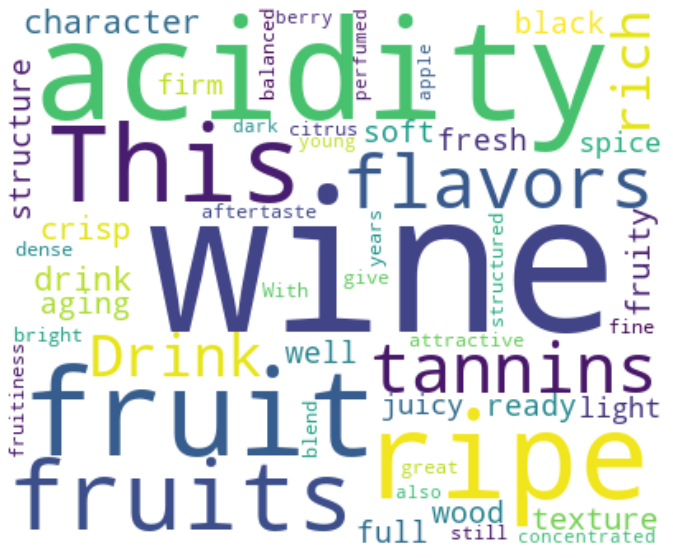

['Paul Gregutt']


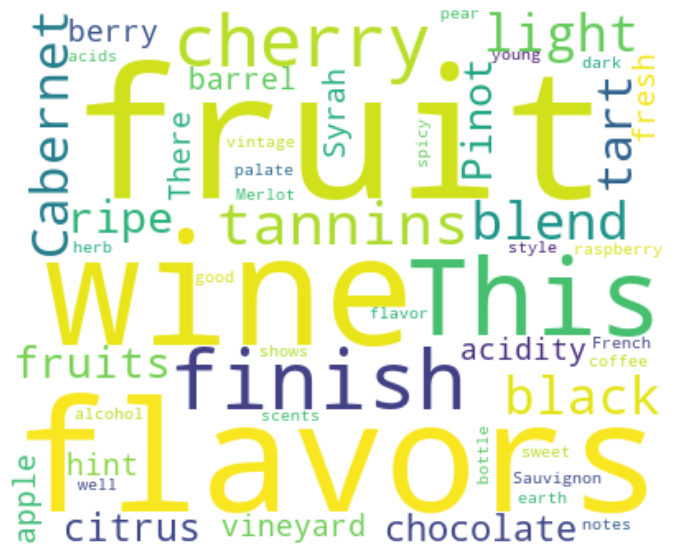

['Alexander Peartree']


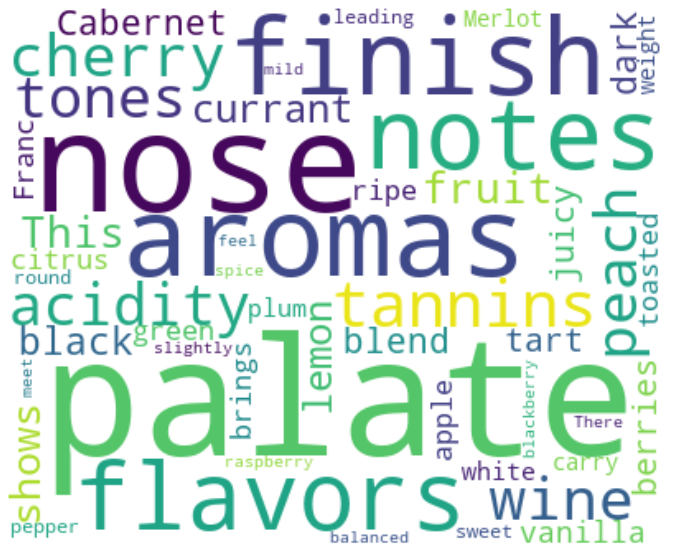

['Michael Schachner']


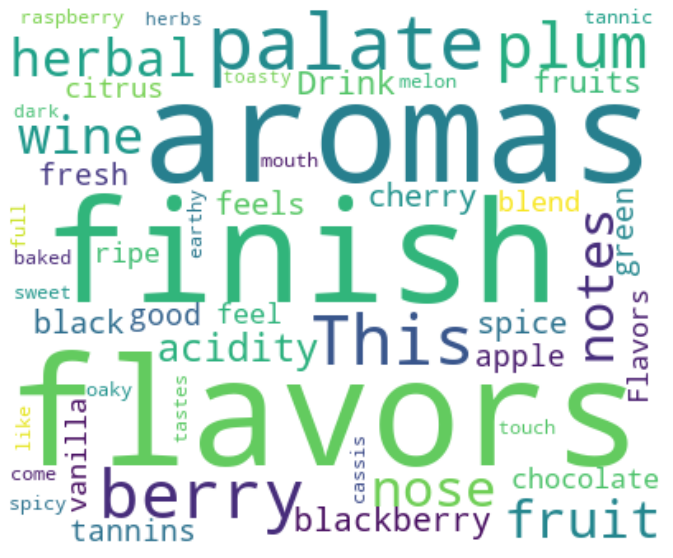

['Anna Lee C. Iijima']


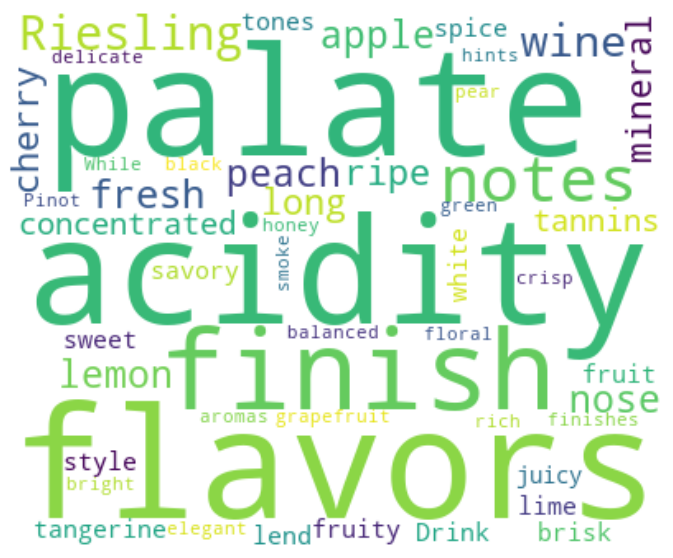

['Virginie Boone']


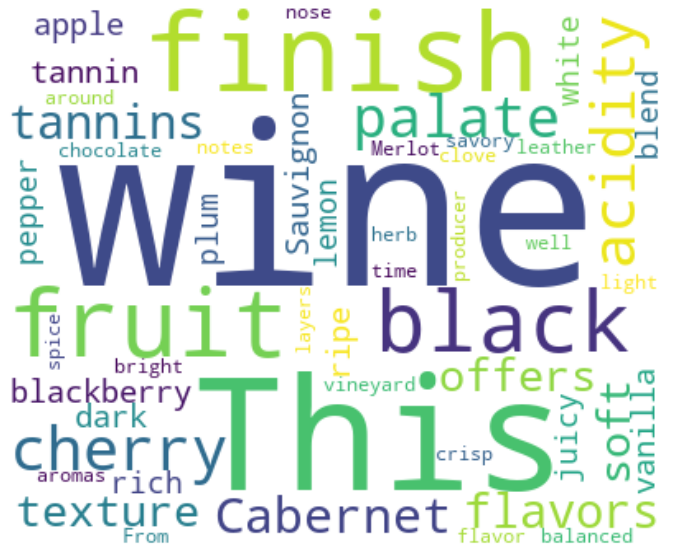

['Matt Kettmann']


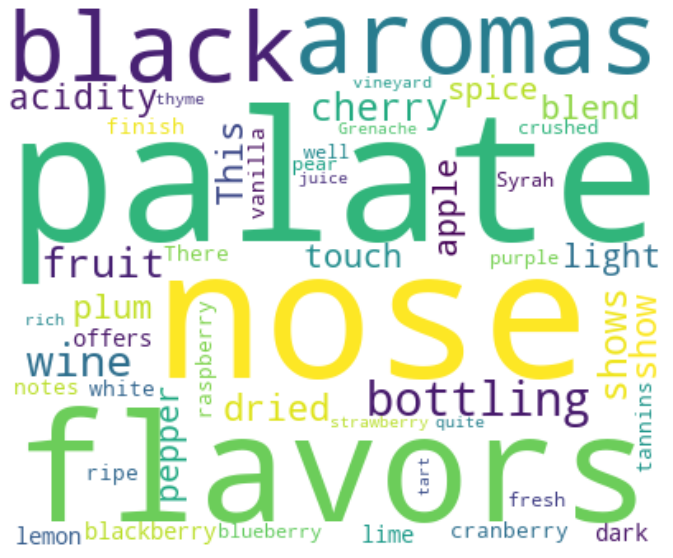

['Sean P. Sullivan']


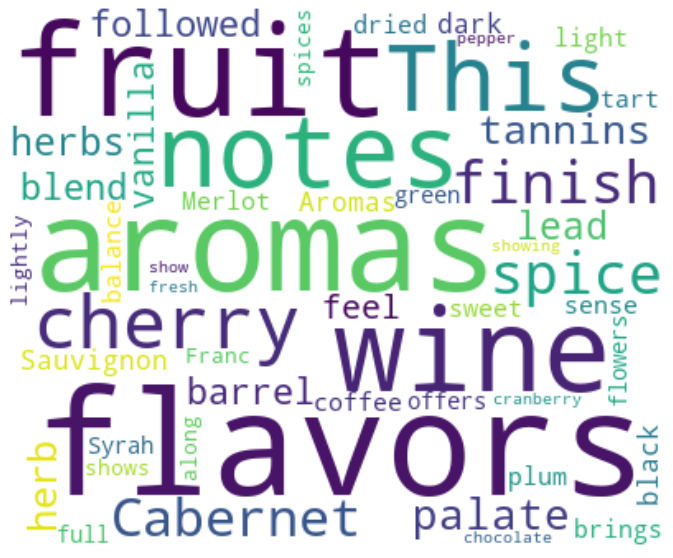

['Jim Gordon']


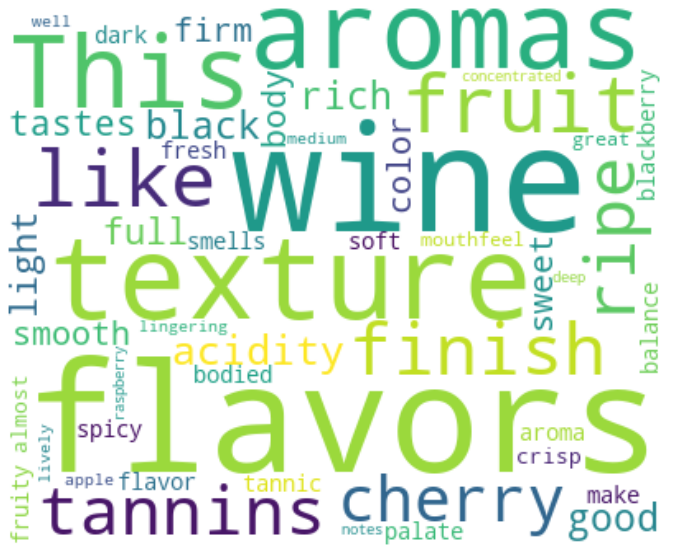

['Joe Czerwinski']


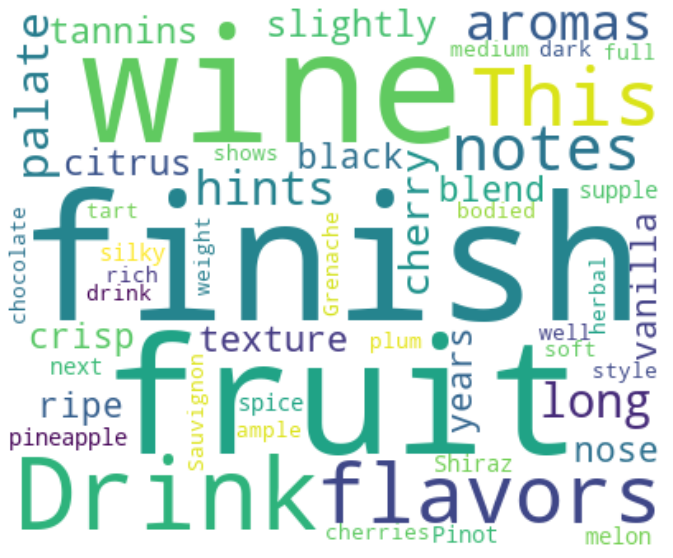

['Anne Krebiehl\xa0MW']


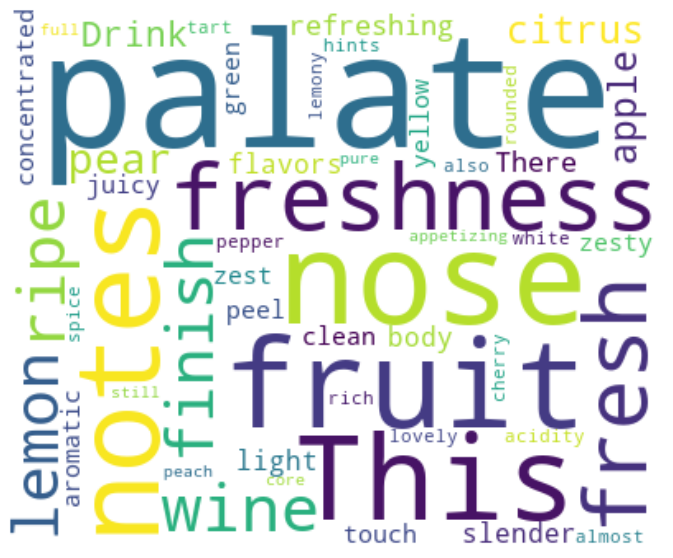

['Lauren Buzzeo']


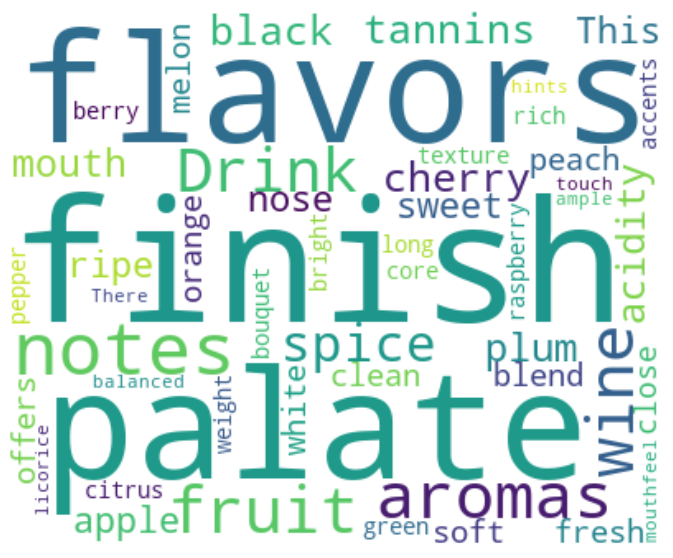

['Mike DeSimone']


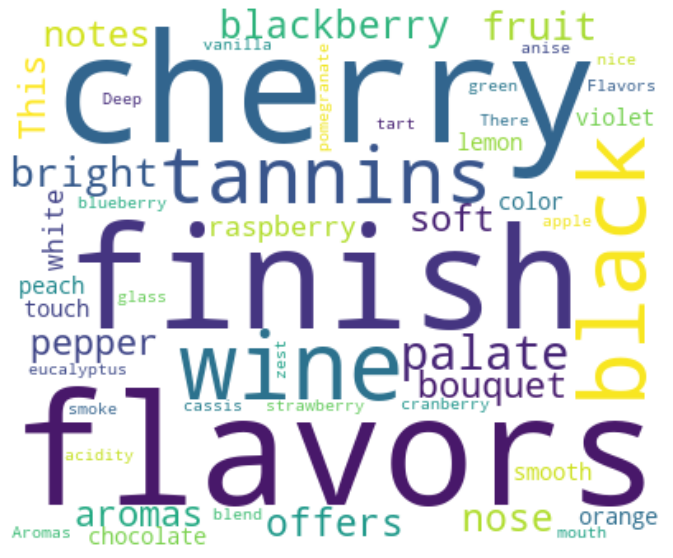

['Jeff Jenssen']


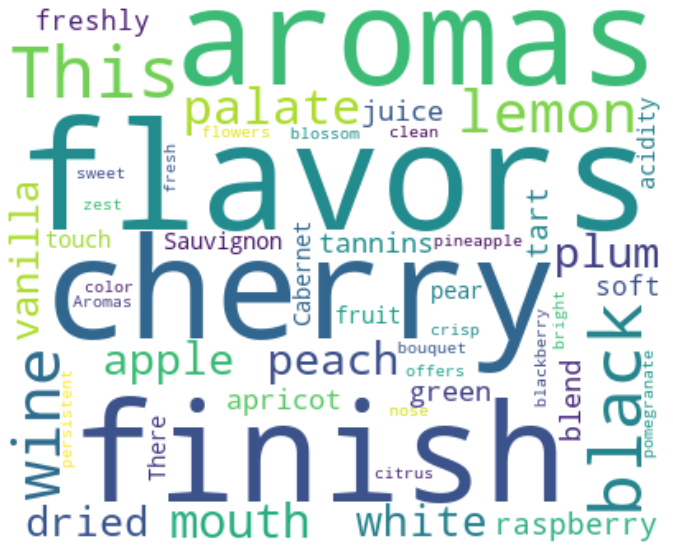

['Susan Kostrzewa']


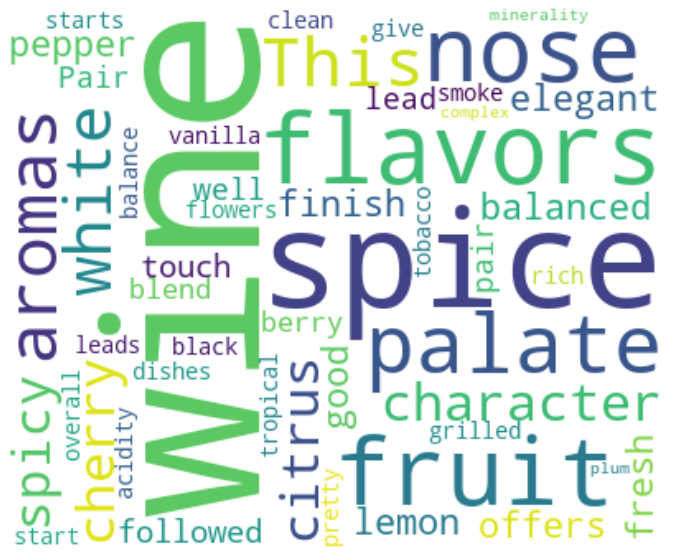

['Carrie Dykes']


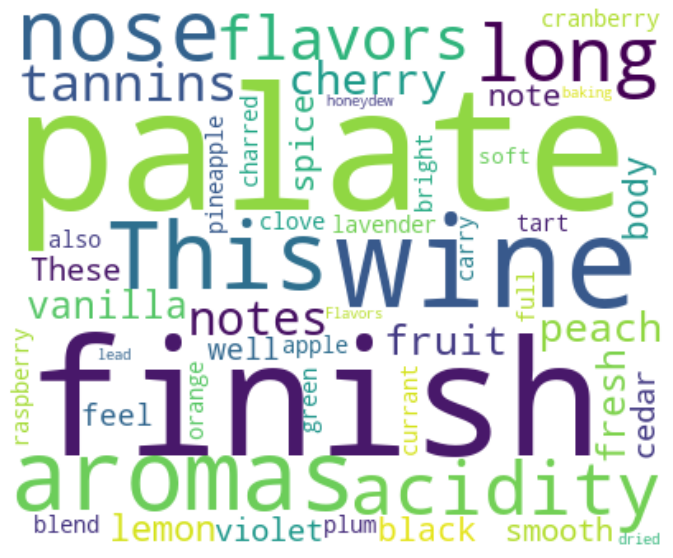

['Fiona Adams']


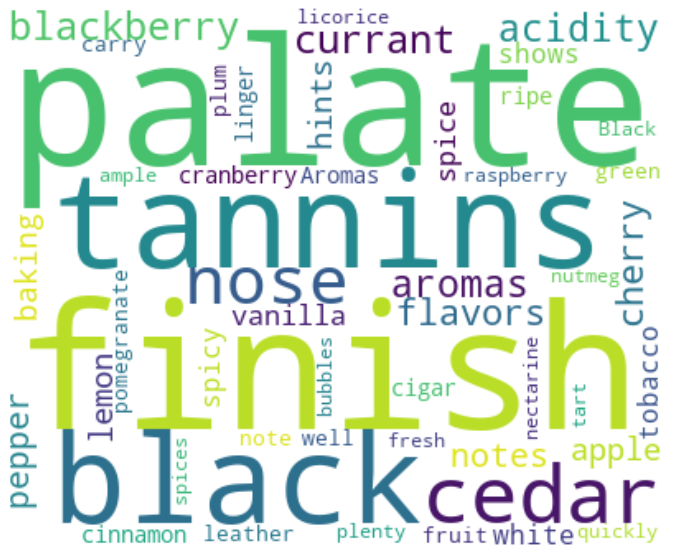

['Christina Pickard']


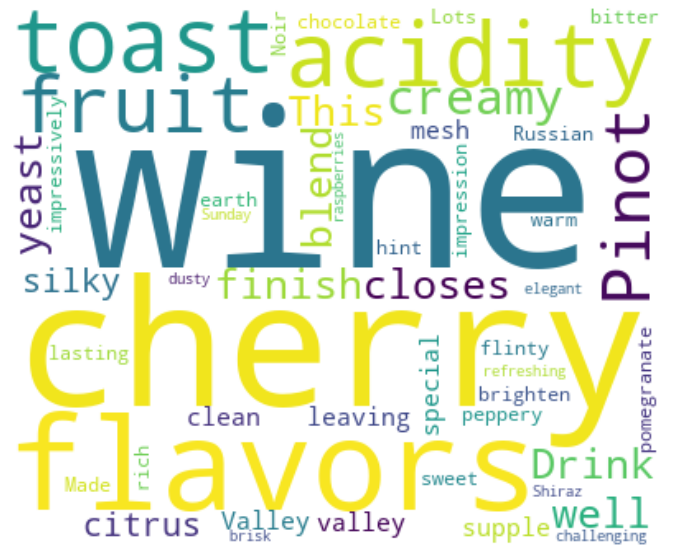

In [19]:
for i in df_raw['taster_name'].dropna().unique():
    newb=df_raw[['description','taster_name']][df_raw['taster_name']==i]
    newb['description'] = newb['description'].apply(lambda x: ' '.join([w for w in nltk.word_tokenize(x) if w.isalpha() == True and len(w)>3 and not w in stop_words]))
    word_freq_view = gen_freq(newb['description'].tolist())
    wc_normal = WordCloud(width = 400, height = 330, max_words = 50, background_color = 'white', stopwords = stop_words).generate_from_frequencies(word_freq_view)
    print(newb['taster_name'].unique())
    plt.figure(figsize = (14, 10))
    plt.imshow(wc_normal, interpolation = 'bilinear')
    plt.axis('off')
    plt.show()

## Observation: 
After removing the Stop-Words, the Word Clouds helped me understand what a Reviewer looks for first and as a whole while tasting the wine.<ul><li>The words such as 'Palate' and 'Aroma' having high frequency implies that a Reviewer is looking for taste and smell respectively.</li></ul>
Also, certain words such as 'acidity', 'citrus' and 'elegant' do talk about their primary sense of consumption, what does drinking this wine make them 'feel.

SO yes, hence, The Reviews do contain the information that relays what a Reviewer looks for first and how one consumes the Wine and what does the Wine make them feel. I do think We can do the Prediction of A Reviewer based on Reviews.

### Now Let's look at the Number of Reviews each Reviewer has written.

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


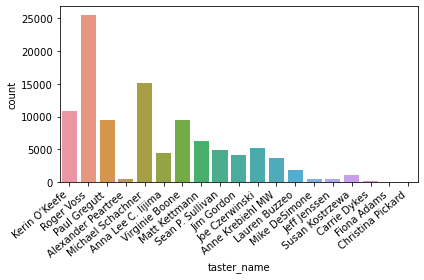

In [7]:
ds = pd.Series(df_raw['taster_name'])
ax=sns.countplot(df_raw['taster_name'],data=ds)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

#### After normalizing the counts of Reviews by a Reviewer

<AxesSubplot:>

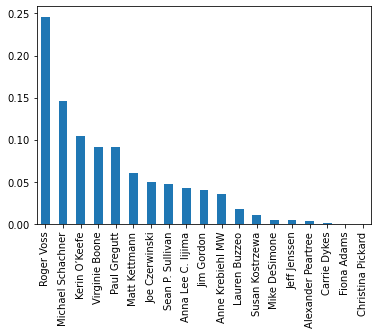

In [8]:
df_raw['taster_name'].value_counts(normalize=True).plot(kind='bar')

In [20]:
df_raw_2 = df_raw.groupby(['taster_name']).size().reset_index(name='count')

In [21]:
df_raw_2

,taster_name,count
0,Alexander Peartree,415
1,Anna Lee C. Iijima,4415
2,Anne Krebiehl MW,3685
3,Carrie Dykes,139
4,Christina Pickard,6
5,Fiona Adams,27
6,Jeff Jenssen,491
7,Jim Gordon,4177
8,Joe Czerwinski,5147
9,Kerin O’Keefe,10776


## Obersvation:
<ul><li>Wow, the Reviews of Fiona Adams and Christina Picarkd almost surely dissapear. This could be a problem to do justice to them.</li>
    <li>Cristina only has written 6 reviews, either that's the truth or the NaNs might have her information (might not be case as when I did the prediction with Nans as Unknown_Reviewers they did seem to be classified with quite good recall.), either way, for now I chose not to focus on her.</li>
    <li>Fiona on the other hand can be saved to an extent using SMOTE analysis.</li></ul>

## The Prediction 

### -Machine Learning

In [9]:
Reviewers = df_raw['taster_name'].fillna('Unknown_Reviewer')

In [10]:
Reviews = df_raw['description'].dropna()

In [11]:
Reviewers.shape

(129971,)

### Splitting the Train and Test sets, with 80-20.

In [12]:
X_train, X_test, Y_train, Y_test = train_test_split(Reviews,Reviewers,stratify=Reviewers,test_size=0.2,random_state=100)

In [13]:
tv = TfidfVectorizer(min_df = 0., max_df = 1., norm = 'l2', use_idf = True, smooth_idf = True)

train_tfidf = tv.fit_transform(X_train)
test_tfidf = tv.transform(X_test)

print(train_tfidf.shape)
print(test_tfidf.shape)

(103976, 28944)
(25995, 28944)


## Logistic Regression.
    My primary intuition to start with this was because we could consider the high frequent words to be the dimensions of the Manifold the documents create and the Reviewers to be the data points in that Manifold.
    
    And 'curve fitting' would do a tremendous job. As seen, it definietly did.
    
    Altough it didn't have high F1-Score for Reviewers with lesser Reviewers than 100.

In [86]:
log_model = LogisticRegression(penalty = 'l2', solver = 'lbfgs', multi_class = 'ovr', max_iter = 1000, C = 1, random_state = 100)
log_model.fit(train_tfidf, Y_train)

LogisticRegression(C=1, max_iter=1000, multi_class='ovr', random_state=100)

In [87]:
log_predictions = log_model.predict(test_tfidf)

In [88]:
print(classification_report(Y_test,log_predictions))

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                    precision    recall  f1-score   support

Alexander Peartree       0.91      0.35      0.50        83
Anna Lee C. Iijima       0.97      0.96      0.96       883
  Anne Krebiehl MW       0.98      0.96      0.97       737
      Carrie Dykes       1.00      0.04      0.07        28
 Christina Pickard       0.00      0.00      0.00         1
       Fiona Adams       0.00      0.00      0.00         5
      Jeff Jenssen       0.91      0.64      0.75        98
        Jim Gordon       0.97      0.94      0.96       835
    Joe Czerwinski       0.93      0.85      0.89      1029
     Kerin O’Keefe       0.99      0.99      0.99      2155
     Lauren Buzzeo       0.97      0.88      0.92       367
     Matt Kettmann       0.96      0.97      0.97      1267
 Michael Schachner       0.95      0.97      0.96      3027
     Mike DeSimone       0.96      0.77      0.85       103
      Paul Gregutt       0.94      0.96      0.95      1907
        Roger Voss       0.99      0.99

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## SMOTE
    SMOTE first selects a minority class instance a at random and finds its k nearest minority class neighbors. The synthetic instance is then created by choosing one of the k nearest neighbors b at random and connecting a and b to form a line segment in the feature space. The synthetic instances are generated as a convex combination of the two chosen instances a and b.
    
    I chose 4 k nearest neighbhors since Fiona Adams, when sampled during the split only had 5 representations of her Reviews.

In [14]:
sm = SMOTE(k_neighbors=4)
X_sm, Y_sm = sm.fit_resample( train_tfidf, Y_train)

In [96]:
log_model = LogisticRegression(penalty = 'l2', solver = 'lbfgs', multi_class = 'ovr', max_iter = 1000, C = 1, random_state = 100)
log_model.fit(X_sm, Y_sm)

LogisticRegression(C=1, max_iter=1000, multi_class='ovr', random_state=100)

In [97]:
log_sm_predictions = log_model.predict(test_tfidf)
print(classification_report(Y_test,log_sm_predictions))

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                    precision    recall  f1-score   support

Alexander Peartree       0.78      0.94      0.85        83
Anna Lee C. Iijima       0.97      0.98      0.98       883
  Anne Krebiehl MW       0.97      0.98      0.98       737
      Carrie Dykes       0.79      0.79      0.79        28
 Christina Pickard       0.00      0.00      0.00         1
       Fiona Adams       1.00      0.20      0.33         5
      Jeff Jenssen       0.91      0.91      0.91        98
        Jim Gordon       0.95      0.97      0.96       835
    Joe Czerwinski       0.88      0.92      0.90      1029
     Kerin O’Keefe       0.99      0.99      0.99      2155
     Lauren Buzzeo       0.92      0.96      0.94       367
     Matt Kettmann       0.98      0.99      0.98      1267
 Michael Schachner       0.97      0.97      0.97      3027
     Mike DeSimone       0.91      0.95      0.93       103
      Paul Gregutt       0.93      0.97      0.95      1907
        Roger Voss       0.99      0.99

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Observation:
<ul>
    <li>With the SMOTE analysis Fiona Adams did get some justice, Precision as expected was high, Recall was low mostly because of the less number of her Rewviews written</li>
    <li>The Precision and Recall did increase although Precision by not so much, still the Recall's case is quite significant I would say</li>
    

## Without Stop Words

In [98]:
Reviews_No_Stop_Words=df_raw['description'].dropna().apply(lambda x: ' '.join([w for w in nltk.word_tokenize(x) if w.isalpha() == True and len(w)>3 and not w in stop_words]))

In [195]:
X_train, X_test, Y_train, Y_test = train_test_split(Reviews_No_Stop_Words,Reviewers,stratify=Reviewers,test_size=0.2,random_state=100)

In [196]:
tv = TfidfVectorizer(min_df = 0., max_df = 1., norm = 'l2', use_idf = True, smooth_idf = True)

train_tfidf = tv.fit_transform(X_train)
test_tfidf = tv.transform(X_test)

print(train_tfidf.shape)
print(test_tfidf.shape)

(103976, 26810)
(25995, 26810)


## SMOTE Analysis
    Chose to stick with SMOTE analysis in order to Include Fiona Adams.

In [197]:
sm = SMOTE(k_neighbors=4)
X_sm, Y_sm = sm.fit_resample( train_tfidf, Y_train)

In [103]:
log_model = LogisticRegression(penalty = 'l2', solver = 'lbfgs', multi_class = 'ovr', max_iter = 1000, C = 1, random_state = 100)
log_model.fit(X_sm, Y_sm)

LogisticRegression(C=1, max_iter=1000, multi_class='ovr', random_state=100)

In [104]:
log_sm_predictions = log_model.predict(test_tfidf)
print(classification_report(Y_test,log_sm_predictions))

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                    precision    recall  f1-score   support

Alexander Peartree       0.66      0.86      0.75        83
Anna Lee C. Iijima       0.95      0.97      0.96       883
  Anne Krebiehl MW       0.97      0.99      0.98       737
      Carrie Dykes       0.59      0.79      0.68        28
 Christina Pickard       0.00      0.00      0.00         1
       Fiona Adams       0.50      0.20      0.29         5
      Jeff Jenssen       0.84      0.91      0.87        98
        Jim Gordon       0.90      0.96      0.93       835
    Joe Czerwinski       0.86      0.90      0.88      1029
     Kerin O’Keefe       0.99      0.99      0.99      2155
     Lauren Buzzeo       0.90      0.94      0.92       367
     Matt Kettmann       0.97      0.98      0.97      1267
 Michael Schachner       0.96      0.96      0.96      3027
     Mike DeSimone       0.84      0.93      0.88       103
      Paul Gregutt       0.92      0.95      0.93      1907
        Roger Voss       0.99      0.98

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Observations:
<ul><li>Not much of a difference on average, but definietly less without Stop_Words.</li>
    <li>The Precisions of Reviewers definietly did drop especially the ones with less number of Reviews.<ul><li>I suspect that stop_words usuage might be related to the slang of a Reviewer</li>

### Different solver - LibLinear
   It uses an estimation to the inverse Hessian Matrix, which is approximated, what is means is that it saves a lot of memory, although it might have the risk of not converging to anything.
   
   I believe although the drawback exists, which the dataset being small it surely would converge. Which it did. 

In [106]:
log_model_2 = LogisticRegression(penalty = 'l2', solver = 'liblinear', multi_class = 'ovr', max_iter = 1000, C = 1, random_state = 100)
log_model_2.fit(X_sm, Y_sm)

LogisticRegression(C=1, max_iter=1000, multi_class='ovr', random_state=100,
                   solver='liblinear')

In [107]:
log_sm_predictions = log_model_2.predict(test_tfidf)
print(classification_report(Y_test,log_sm_predictions))

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                    precision    recall  f1-score   support

Alexander Peartree       0.67      0.87      0.75        83
Anna Lee C. Iijima       0.95      0.97      0.96       883
  Anne Krebiehl MW       0.97      0.99      0.98       737
      Carrie Dykes       0.58      0.79      0.67        28
 Christina Pickard       0.00      0.00      0.00         1
       Fiona Adams       0.50      0.20      0.29         5
      Jeff Jenssen       0.84      0.91      0.87        98
        Jim Gordon       0.90      0.96      0.93       835
    Joe Czerwinski       0.86      0.90      0.88      1029
     Kerin O’Keefe       0.99      0.99      0.99      2155
     Lauren Buzzeo       0.90      0.94      0.92       367
     Matt Kettmann       0.97      0.98      0.97      1267
 Michael Schachner       0.96      0.96      0.96      3027
     Mike DeSimone       0.84      0.93      0.88       103
      Paul Gregutt       0.92      0.95      0.93      1907
        Roger Voss       0.99      0.98

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Different Solver - SAG
    This SAG-Stochstic Average Gradient, incorporates a memory of previous gradient values, leading to a much faster convergence rate.

In [109]:
log_model_3 = LogisticRegression(penalty = 'l2', solver = 'sag', multi_class = 'ovr', max_iter = 1000, C = 1, random_state = 100)
log_model_3.fit(X_sm, Y_sm)

LogisticRegression(C=1, max_iter=1000, multi_class='ovr', random_state=100,
                   solver='sag')

In [110]:
log_sm_predictions = log_model_3.predict(test_tfidf)
print(classification_report(Y_test,log_sm_predictions))

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                    precision    recall  f1-score   support

Alexander Peartree       0.66      0.86      0.75        83
Anna Lee C. Iijima       0.95      0.97      0.96       883
  Anne Krebiehl MW       0.97      0.99      0.98       737
      Carrie Dykes       0.59      0.79      0.68        28
 Christina Pickard       0.00      0.00      0.00         1
       Fiona Adams       0.50      0.20      0.29         5
      Jeff Jenssen       0.84      0.91      0.87        98
        Jim Gordon       0.90      0.96      0.93       835
    Joe Czerwinski       0.86      0.90      0.88      1029
     Kerin O’Keefe       0.99      0.99      0.99      2155
     Lauren Buzzeo       0.90      0.94      0.92       367
     Matt Kettmann       0.97      0.98      0.97      1267
 Michael Schachner       0.96      0.96      0.96      3027
     Mike DeSimone       0.84      0.93      0.88       103
      Paul Gregutt       0.92      0.95      0.93      1907
        Roger Voss       0.99      0.98

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Observation:
<ul><li> Logistic Regression Classification is a significant hit and friendly towards the Reviewers with high number of Reviews as expected.</li>
    <li> Although, LRC has a good recall for minor classes too, so the wrong classification of Reviews of major class to the minor ones, will not happen so frequently.</li>
    <li> This Is a sufficiently good model with no over fitting.</li>
    

### What about Predicting a Review?

In [145]:
newb=df_raw[['description','taster_name']][df_raw['taster_name']=='nan']

In [179]:
test_data=df_raw[['description']][df_raw['taster_name'].isnull()]

In [176]:
test_one = [test_data.at[33,'description']]

In [180]:
test_data_see=test_data['description'].apply(lambda x: ' '.join([w for w in nltk.word_tokenize(x) if w.isalpha() == True and len(w)>3 and not w in stop_words]))

In [182]:
test_data_see.at[33]

'Rustic flavors berries currants licorice spices Made Cabernet Franc Cabernet Sauvignon'

In [186]:
test_one_review = tv.transform([test_data_see.at[33]])

In [187]:
log_model_2.predict(test_one_review)

array(['Unknown_Reviewer'], dtype=object)

### Observation
Works good, since Unknown_Reviewer the replacement of NaNs is as labeled, Unknown and mysterious

I suspect this is so because they Reviews were taken from a Reviewer with an account at some place with no details.

And, Unknown_Reviewer having quite a High Recall and Precision does say it's the same Reviewer, quite weird to be honest.

## Testing out Bunch of Different ML - Algorithms

### Random Forest
    Because limitation of my Laptop and my Time constraints I didn't use deeper trees. Although, yes, I did test this on Colab, but still it didn't generate a better performance than Logistic Regression
    
    But, yes the Minor Classes's Precision and Recall were a tad bit better than the Logistic. 
    
    I used Gini, I suspect had I used Information Grain although the time taken would be high ( only CPU was available during this), the precisson and Recall would be better.

In [19]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators = 100,criterion = 'gini', max_depth=15)
model.fit(X_sm, Y_sm)

RandomForestClassifier(max_depth=15)

In [20]:
Y_predicted = model.predict(test_tfidf)

print(classification_report(Y_test,Y_predicted))

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                    precision    recall  f1-score   support

Alexander Peartree       0.42      0.65      0.51        83
Anna Lee C. Iijima       0.72      0.77      0.75       883
  Anne Krebiehl MW       0.74      0.82      0.77       737
      Carrie Dykes       0.20      0.43      0.27        28
 Christina Pickard       0.00      0.00      0.00         1
       Fiona Adams       0.67      0.40      0.50         5
      Jeff Jenssen       0.32      0.83      0.46        98
        Jim Gordon       0.65      0.86      0.74       835
    Joe Czerwinski       0.67      0.56      0.61      1029
     Kerin O’Keefe       0.84      0.93      0.88      2155
     Lauren Buzzeo       0.76      0.69      0.72       367
     Matt Kettmann       0.88      0.84      0.86      1267
 Michael Schachner       0.88      0.77      0.82      3027
     Mike DeSimone       0.54      0.85      0.66       103
      Paul Gregutt       0.77      0.56      0.65      1907
        Roger Voss       0.71      0.98

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### K-NN
    I used the Cosine Similarity suspecting that the similarity based on angles between data points (Reviewer) over the manifold of dimensions of Words would be a better measure.

In [21]:
from sklearn.neighbors import KNeighborsClassifier

model_2 = KNeighborsClassifier(n_neighbors=30,metric='cosine')
model_2.fit(X_sm,Y_sm)

KNeighborsClassifier(metric='cosine', n_neighbors=30)

In [22]:
Y_predicted = model_2.predict(test_tfidf)

print(classification_report(Y_test,Y_predicted))

                    precision    recall  f1-score   support

Alexander Peartree       0.23      0.67      0.34        83
Anna Lee C. Iijima       0.82      0.90      0.86       883
  Anne Krebiehl MW       0.85      0.92      0.88       737
      Carrie Dykes       0.11      0.68      0.19        28
 Christina Pickard       0.00      0.00      0.00         1
       Fiona Adams       0.03      0.60      0.06         5
      Jeff Jenssen       0.12      0.90      0.21        98
        Jim Gordon       0.52      0.93      0.67       835
    Joe Czerwinski       0.73      0.74      0.73      1029
     Kerin O’Keefe       0.88      0.99      0.93      2155
     Lauren Buzzeo       0.41      0.92      0.56       367
     Matt Kettmann       0.90      0.82      0.86      1267
 Michael Schachner       0.96      0.83      0.89      3027
     Mike DeSimone       0.24      0.93      0.38       103
      Paul Gregutt       0.88      0.58      0.70      1907
        Roger Voss       0.96      0.96

## SVM - The Magician
    I always call SVMs the magicians because the very core of construction of this algorithm is such that the bottom line of a Loss function is a Dual Optimization problem of Paraboloid which has a high probability of going to the Global Optimum, since we only consider the dot product of Two points over the manifold for the construction of the hyperplane.

In [15]:
fo

In [16]:
model_3 = LinearSVC(multi_class='ovr',dual=True)
model_3.fit(X_sm,Y_sm)

LinearSVC()

In [17]:
Y_predicted = model_3.predict(test_tfidf)

print(classification_report(Y_test,Y_predicted))

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                    precision    recall  f1-score   support

Alexander Peartree       0.87      0.86      0.86        83
Anna Lee C. Iijima       0.98      0.99      0.98       883
  Anne Krebiehl MW       0.98      0.99      0.99       737
      Carrie Dykes       0.74      0.82      0.78        28
 Christina Pickard       0.00      0.00      0.00         1
       Fiona Adams       0.33      0.20      0.25         5
      Jeff Jenssen       0.87      0.88      0.87        98
        Jim Gordon       0.95      0.97      0.96       835
    Joe Czerwinski       0.92      0.92      0.92      1029
     Kerin O’Keefe       0.99      0.99      0.99      2155
     Lauren Buzzeo       0.95      0.96      0.96       367
     Matt Kettmann       0.98      0.99      0.98      1267
 Michael Schachner       0.97      0.98      0.97      3027
     Mike DeSimone       0.90      0.92      0.91       103
      Paul Gregutt       0.95      0.97      0.96      1907
        Roger Voss       0.99      0.99

C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Rohit\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Observation:
<ul><li>As assumed, SVMs do a tremendous job in classifying the Reviewers based on Reviews, in less time surely than the Logistic Regression.</li>
    <li>Even the Reviewers with less number of Reviewes than 100, did perform better, unfortunately for Fiona and Carrie it wasn't the case<ul><li>Carrie's precision was significantly better than logistic regression.</li></ul></li>

## End of Day...?

I would say I would go with SVMs. 

Try to get more Reviews written by Christina, Fiona and Carrie. Didn't want to Impute the data more with the worry that I would just be ending up generating my data and won't be the true distribution of data_set.

I wouldn't recommend going to Deep Learning, since ML algorithms were pretty good models.

I would further might also try to increase the weightage of the minor classes (Reviewers with less Reviews)